In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

import seaborn as sns

I0000 00:00:1785687194.701301  646031 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1785687196.204034  646031 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1785687203.997494  646031 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [2]:
basic_cnn = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Basic_cnn/basic_cnn.keras")
deep_cnn = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/deep_cnn/deep_cnn.keras")
cnn_bn = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Cnn_bn/cnn_bn.keras")
cnn_dropout = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Cnn_dp/cnn_dp.keras")
mobilenet_model = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Mobilenet_Model/mobilenet_model.keras")
efficient_model = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/EfficientNet_Model/efficient_model.keras")
resnet_model = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Resnet_Model/resnet_model.keras")
densenet_model = tf.keras.models.load_model("/home/aximsoft/Downloads/Weekend_Task/Skin Disease Classification & Diagnosis Platform/Models/Densenet_Model/densenet_model.keras")

E0000 00:00:1785687210.475426  646031 cuda_platform.cc:52] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [3]:
data = pd.read_csv("../Dataset/HAM10000_metadata.csv")

In [4]:
import os
image_dir1 = "../Dataset/HAM10000_images_part_1"
image_dir2 = "../Dataset/HAM10000_images_part_2"

image_paths = {}

for folder in [image_dir1, image_dir2]:

    for img in os.listdir(folder):

        image_id = img.split(".")[0]

        image_paths[image_id] = os.path.join(folder,img)

data["path"] = data["image_id"].map(image_paths)

data.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,../Dataset/HAM10000_images_part_1/ISIC_0027419...
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,../Dataset/HAM10000_images_part_1/ISIC_0025030...
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,../Dataset/HAM10000_images_part_1/ISIC_0026769...
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,../Dataset/HAM10000_images_part_1/ISIC_0025661...
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,../Dataset/HAM10000_images_part_2/ISIC_0031633...


In [5]:
train_df, temp_df = train_test_split(data, test_size=0.3, random_state=42, stratify=data["dx"] )

In [6]:
valid_df, test_df = train_test_split(temp_df , test_size= 0.5, random_state= 42, stratify=temp_df["dx"])

In [7]:
import tensorflow as tf
import numpy as np

# =====================================================
# Split Dataset
# =====================================================

train_df, temp_df = train_test_split(
    data,
    test_size=0.30,
    random_state=42,
    stratify=data["dx"]
)

valid_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["dx"]
)

# =====================================================
# Label Encoding
# =====================================================

label_encoder = LabelEncoder()

train_df["label"] = label_encoder.fit_transform(train_df["dx"])
valid_df["label"] = label_encoder.transform(valid_df["dx"])
test_df["label"] = label_encoder.transform(test_df["dx"])

NUM_CLASSES = len(label_encoder.classes_)

# =====================================================
# Class Weights
# =====================================================

class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_df["label"]),
    y=train_df["label"]
)

class_weights = dict(enumerate(class_weights))

# =====================================================
# Image Processing
# =====================================================

IMG_SIZE = (224, 224)

def process_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(
        image,
        channels=3
    )

    image = tf.image.resize(
        image,
        IMG_SIZE
    )

    image = tf.cast(
        image,
        tf.float32
    ) / 255.0

    return image, label

# =====================================================
# Data Augmentation
# =====================================================

data_augmentation = tf.keras.Sequential([

    tf.keras.layers.RandomFlip("horizontal"),

    tf.keras.layers.RandomRotation(0.05),

])

# =====================================================
# Training Dataset
# =====================================================

BATCH_SIZE = 32

train_dataset = tf.data.Dataset.from_tensor_slices(
    (
        train_df["path"],
        train_df["label"]
    )
)

train_dataset = train_dataset.map(
    process_image,
    num_parallel_calls=tf.data.AUTOTUNE
)

train_dataset = train_dataset.shuffle(
    len(train_df)
)

train_dataset = train_dataset.batch(BATCH_SIZE)

train_dataset = train_dataset.map(

    lambda x, y: (
        data_augmentation(
            x,
            training=True
        ),
        y
    ),

    num_parallel_calls=tf.data.AUTOTUNE

)

train_dataset = train_dataset.prefetch(
    tf.data.AUTOTUNE
)

# =====================================================
# Validation Dataset
# =====================================================

valid_dataset = tf.data.Dataset.from_tensor_slices(
    (
        valid_df["path"],
        valid_df["label"]
    )
)

valid_dataset = valid_dataset.map(
    process_image,
    num_parallel_calls=tf.data.AUTOTUNE
)

valid_dataset = valid_dataset.batch(
    BATCH_SIZE
)

valid_dataset = valid_dataset.cache()

valid_dataset = valid_dataset.prefetch(
    tf.data.AUTOTUNE
)

test_dataset = tf.data.Dataset.from_tensor_slices(
    (test_df["path"], test_df["label"])
)

test_dataset = test_dataset.map(
    process_image,
    num_parallel_calls=tf.data.AUTOTUNE
)

BATCH_SIZE = 32

test_dataset = test_dataset.batch(BATCH_SIZE)

test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE)


In [41]:
test_loss, test_accuracy = basic_cnn.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

I0000 00:00:1785682398.103893  499569 service.cc:153] XLA service 0x79bad40317a0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1785682398.104701  499569 service.cc:161]   StreamExecutor [0]: Host, Default Version (Driver: 0.0.0; Runtime: 0.0.0; Toolkit: 0.0.0; DNN: 0.0.0)
I0000 00:00:1785682398.245819  499569 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1785682399.088763  499569 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


47/47 ━━━━━━━━━━━━━━━━━━━━ 31s 617ms/step - accuracy: 0.5808 - loss: 1.1538
Test Loss : 1.1537586450576782
Test Accuracy : 0.5808383226394653


In [42]:
test_loss, test_accuracy = deep_cnn.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.5343 - loss: 1.2904
Test Loss : 1.2903716564178467
Test Accuracy : 0.5342648029327393


In [43]:
test_loss, test_accuracy = cnn_bn.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 30s 620ms/step - accuracy: 0.5629 - loss: 1.5339
Test Loss : 1.5338637828826904
Test Accuracy : 0.5628742575645447


In [44]:
test_loss, test_accuracy = cnn_dropout.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 32s 651ms/step - accuracy: 0.4511 - loss: 1.3992
Test Loss : 1.3992098569869995
Test Accuracy : 0.4510978162288666


In [45]:
test_loss, test_accuracy = mobilenet_model.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 374s 8s/step - accuracy: 0.5675 - loss: 1.0842
Test Loss : 1.0842167139053345
Test Accuracy : 0.5675315856933594


In [46]:
test_loss, test_accuracy = efficient_model.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 494s 10s/step - accuracy: 0.0146 - loss: 1.9528
Test Loss : 1.9527790546417236
Test Accuracy : 0.01463739201426506


In [47]:
test_loss, test_accuracy = resnet_model.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)

47/47 ━━━━━━━━━━━━━━━━━━━━ 178s 4s/step - accuracy: 0.0113 - loss: 1.9445
Test Loss : 1.9445210695266724
Test Accuracy : 0.01131071150302887


In [48]:
test_loss, test_accuracy = densenet_model.evaluate(
    test_dataset,
    verbose=1
)

print("Test Loss :", test_loss)
print("Test Accuracy :", test_accuracy)




47/47 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.5735 - loss: 1.1035
Test Loss : 1.1034754514694214
Test Accuracy : 0.5735196471214294


# Predict Labels

# Basic_cnn

In [56]:
y_probability = basic_cnn.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

47/47 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step


In [57]:
y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

In [58]:
accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

Accuracy : 0.5808383233532934


In [59]:
precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

Precision : 0.7450449006284618


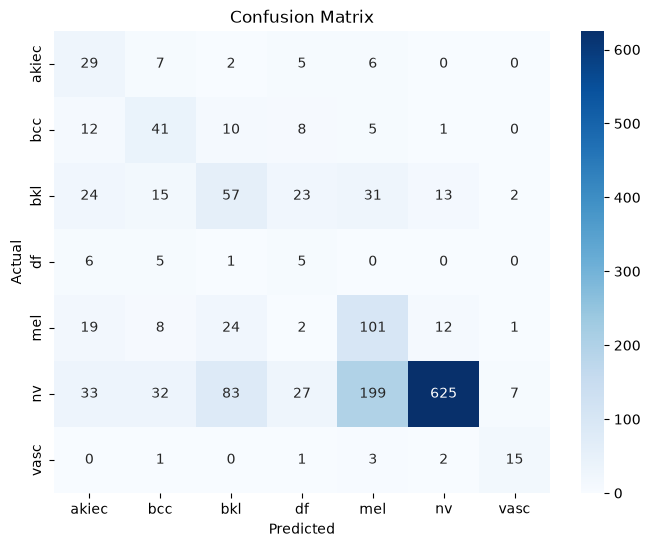

In [60]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

In [61]:
f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

F1 Score : 0.6289536403830991


In [62]:
recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)

Recall : 0.5808383233532934


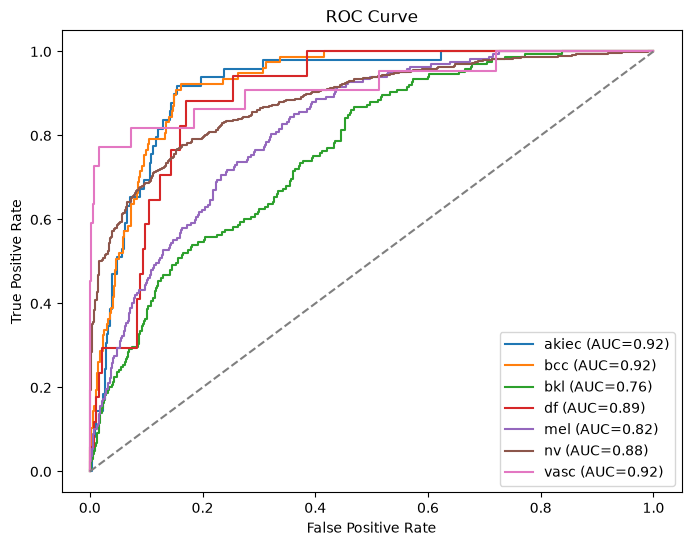

In [64]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

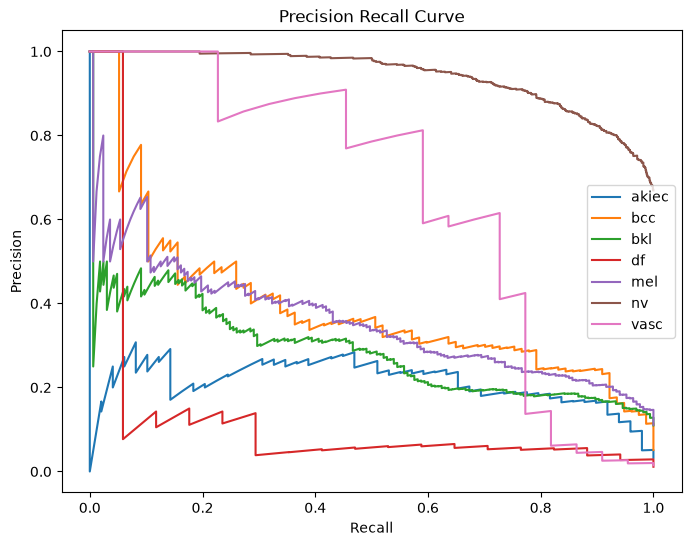

In [65]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

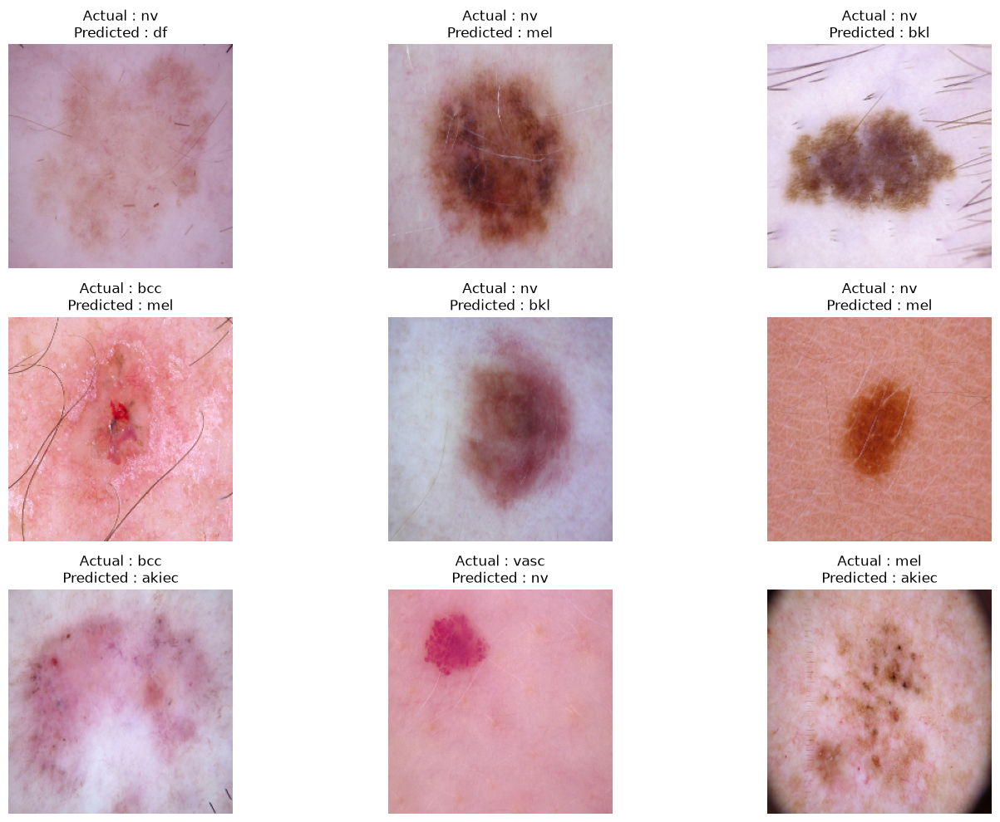

In [67]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

In [50]:
y_prediction

array([2, 3, 5, ..., 5, 5, 5], shape=(1503,))

## Deep Cnn

In [9]:
y_probability = deep_cnn.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

I0000 00:00:1785686707.971732  628907 service.cc:153] XLA service 0x7bcbec030de0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1785686707.971773  628907 service.cc:161]   StreamExecutor [0]: Host, Default Version (Driver: 0.0.0; Runtime: 0.0.0; Toolkit: 0.0.0; DNN: 0.0.0)
I0000 00:00:1785686708.085752  628907 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1785686709.208106  628907 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


47/47 ━━━━━━━━━━━━━━━━━━━━ 49s 994ms/step
Accuracy : 0.5342648037258816
Precision : 0.7017389761573686
Recall : 0.5342648037258816
F1 Score : 0.5865444453513914


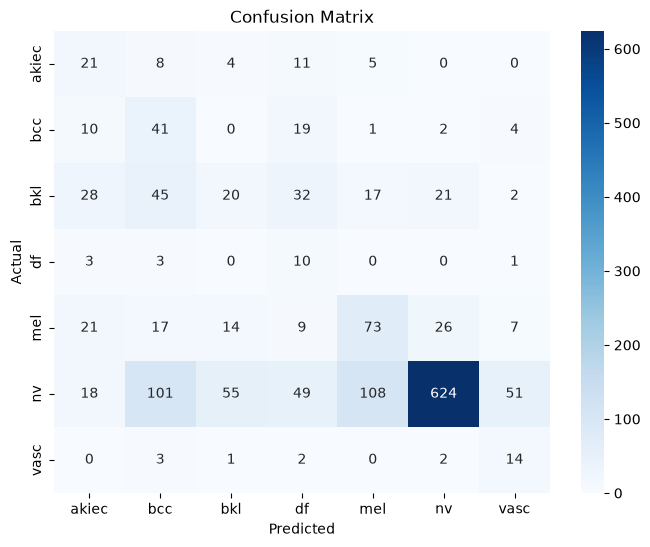

In [10]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

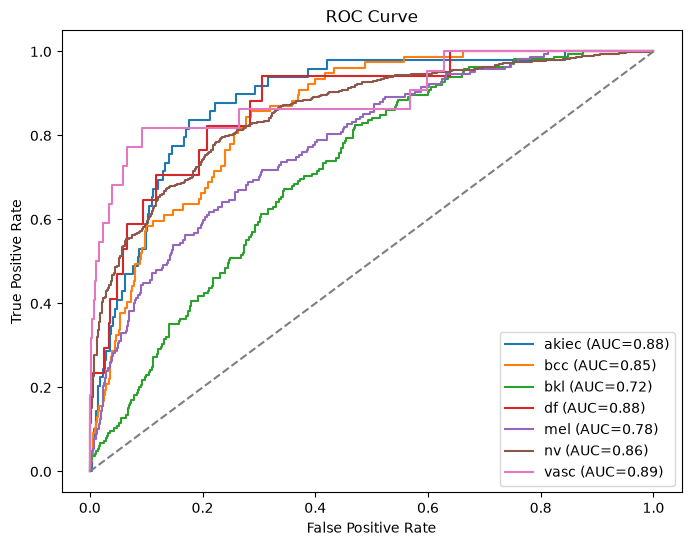

In [11]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

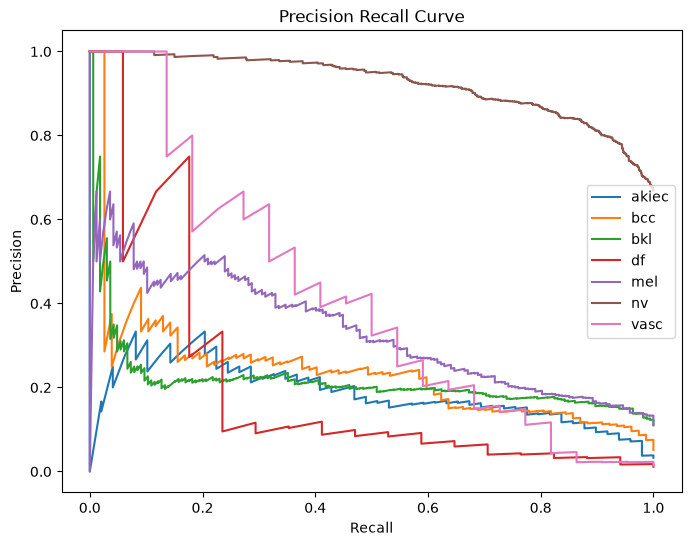

In [12]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

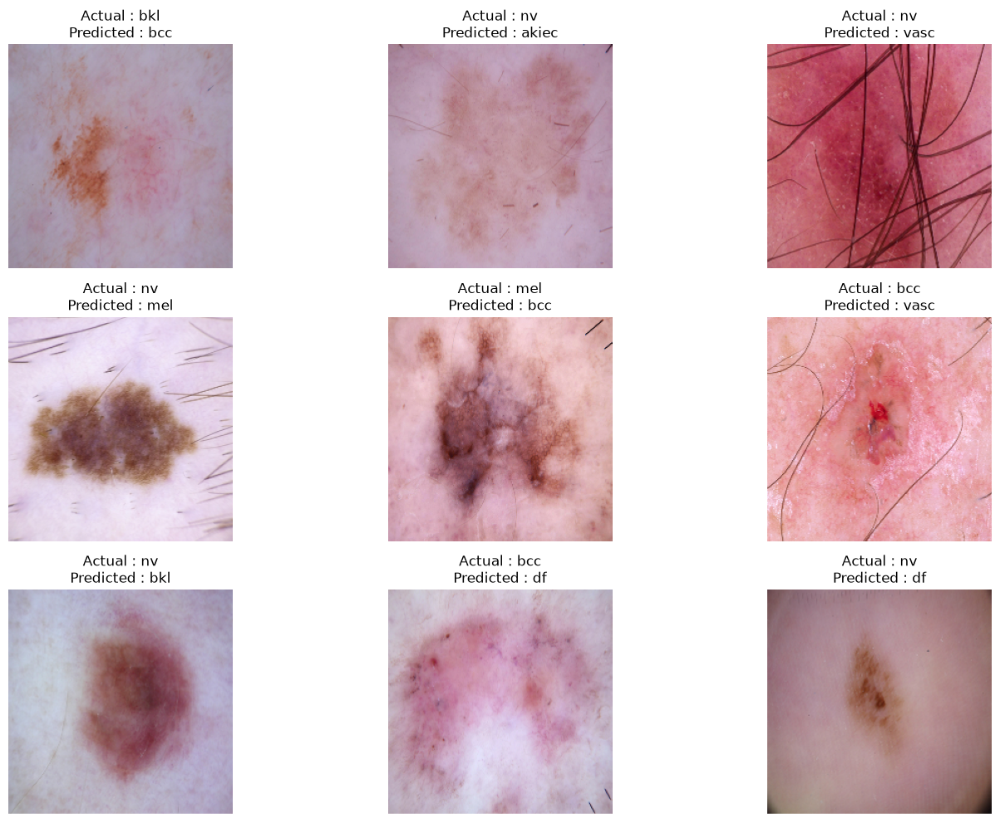

In [13]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

## Batch Normalization

In [10]:
y_probability = cnn_bn.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 46s 958ms/step
Accuracy : 0.562874251497006
Precision : 0.6768042289390137
Recall : 0.562874251497006
F1 Score : 0.6013955638421254


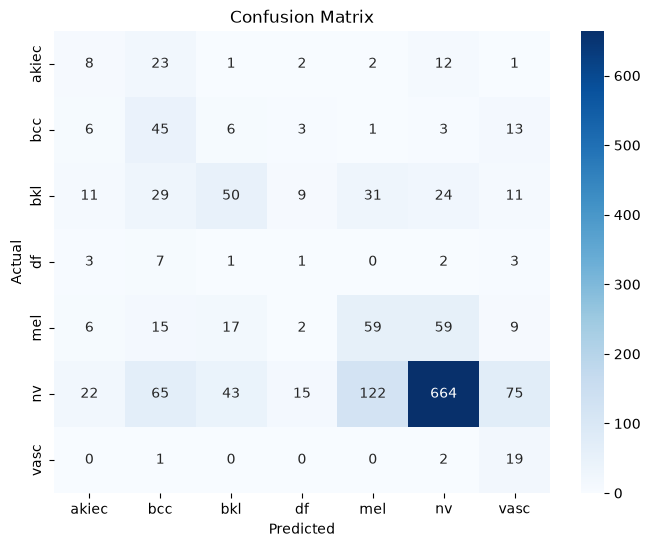

In [15]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

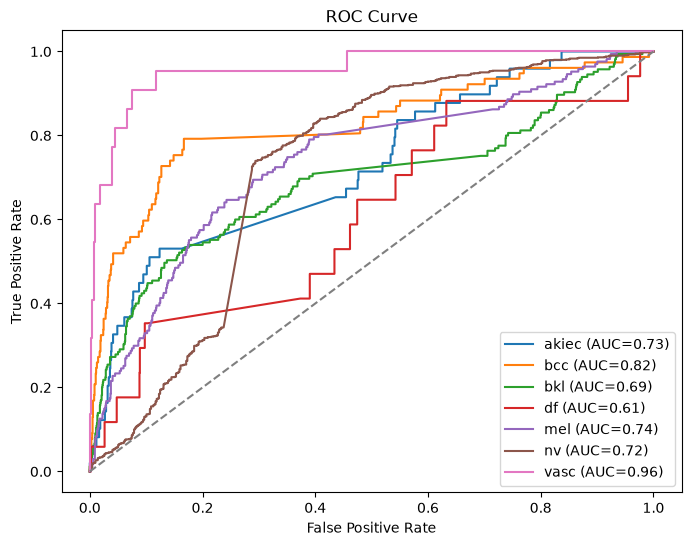

In [16]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

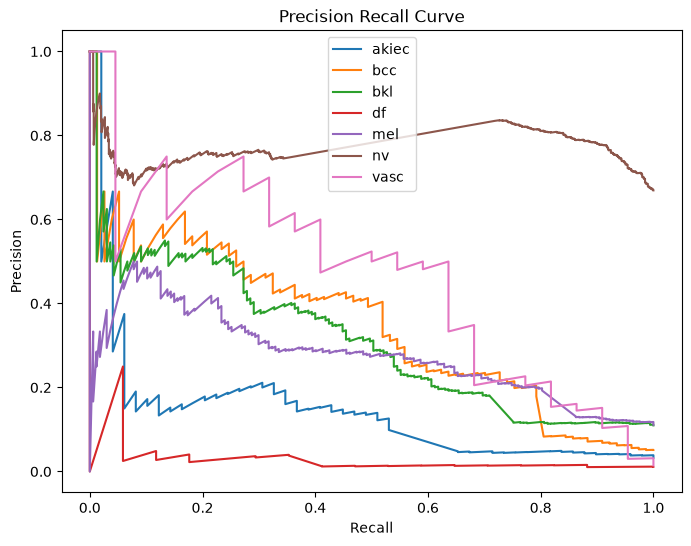

In [17]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

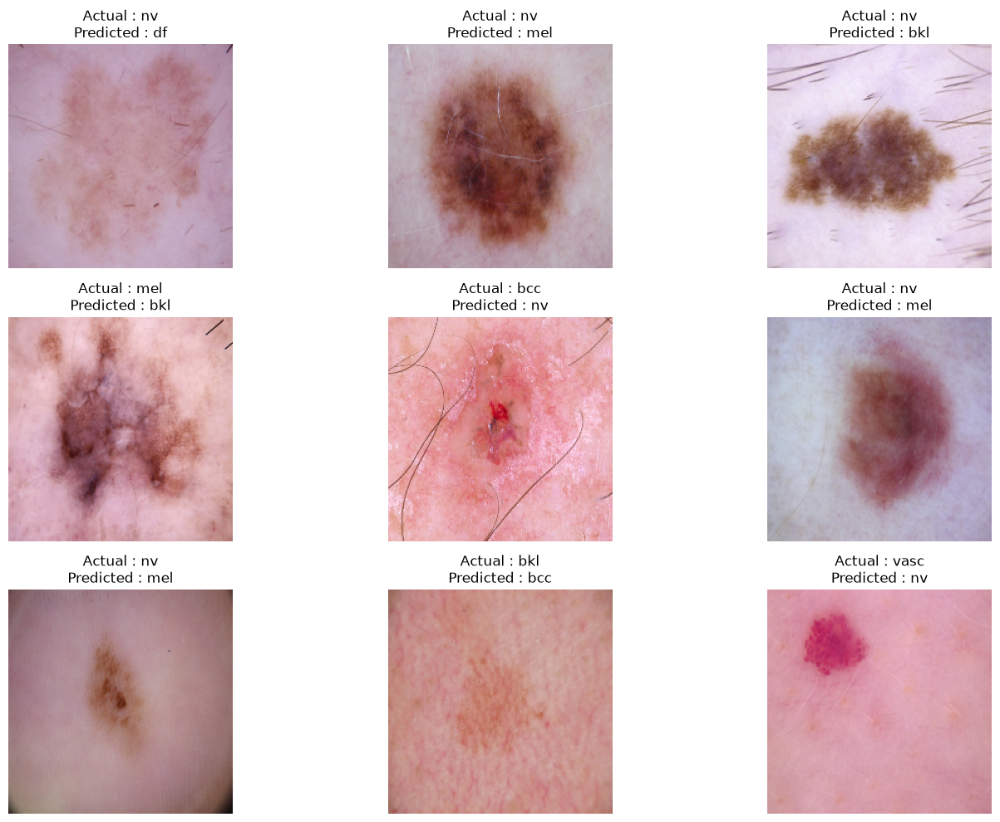

In [11]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

## Drop Out

In [8]:
y_probability = cnn_dropout.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

I0000 00:00:1785687288.933637  646130 service.cc:153] XLA service 0x705c94030c40 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1785687288.935207  646130 service.cc:161]   StreamExecutor [0]: Host, Default Version (Driver: 0.0.0; Runtime: 0.0.0; Toolkit: 0.0.0; DNN: 0.0.0)
I0000 00:00:1785687289.041199  646130 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1785687289.770937  646130 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


47/47 ━━━━━━━━━━━━━━━━━━━━ 36s 745ms/step
Accuracy : 0.45109780439121755
Precision : 0.6916289220458761
Recall : 0.45109780439121755
F1 Score : 0.5129077642584795


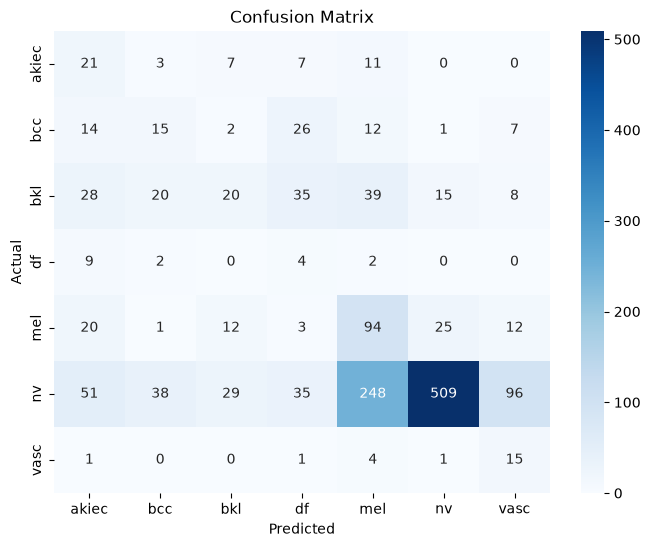

In [13]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

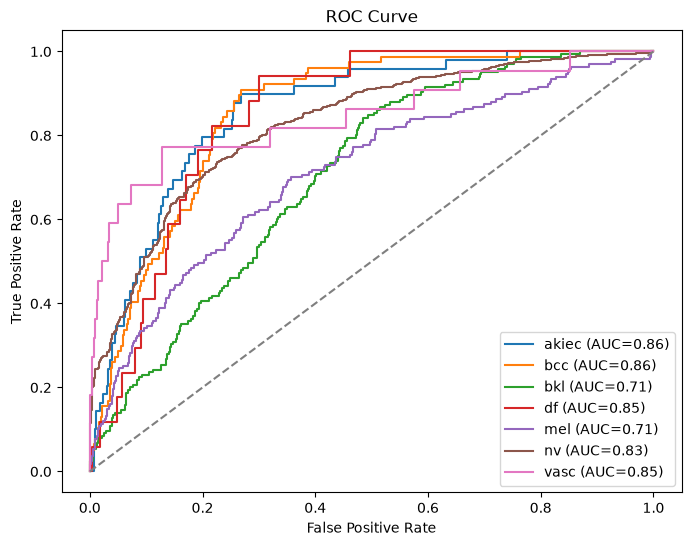

In [14]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

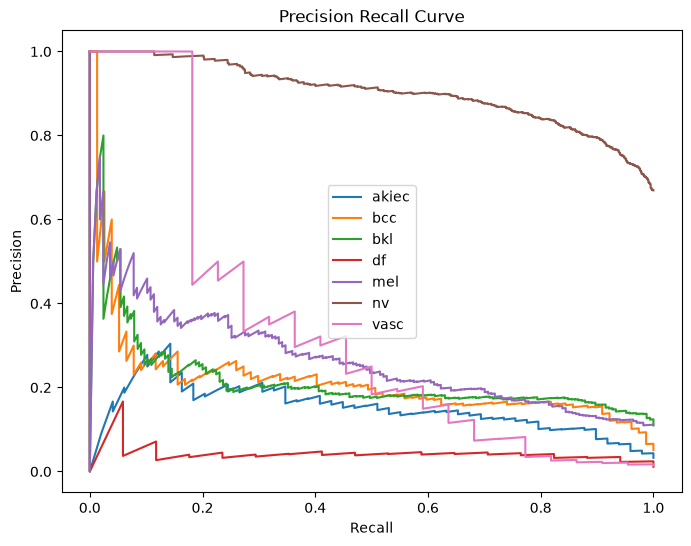

In [15]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

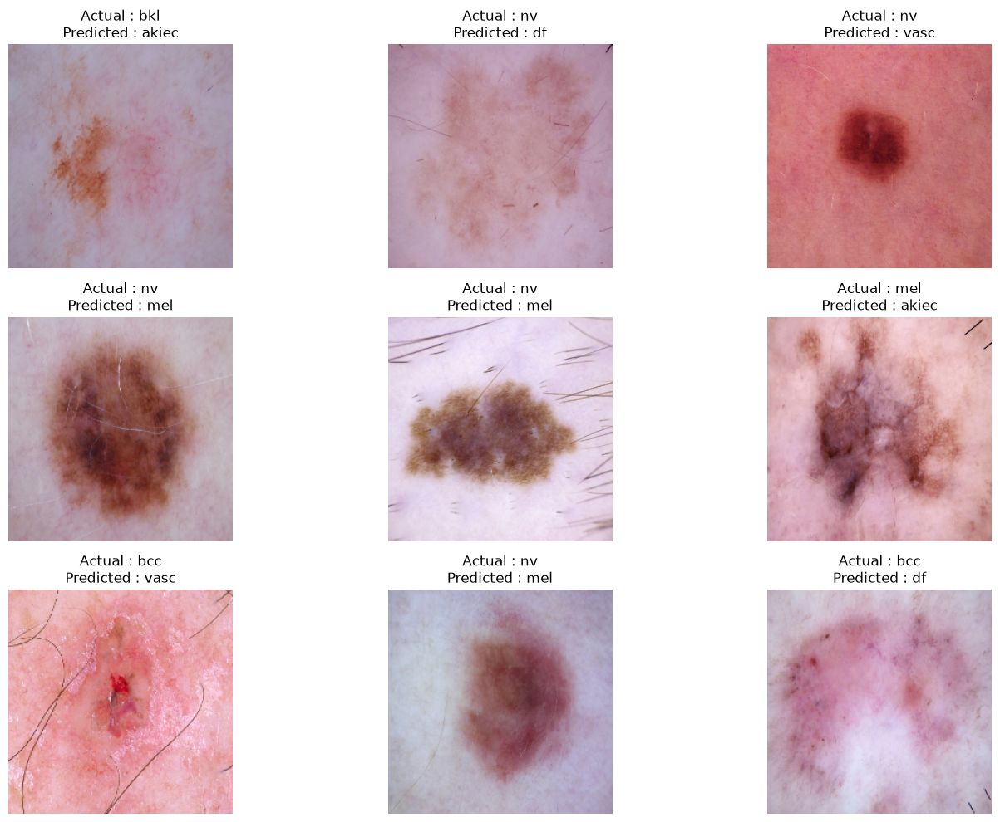

In [9]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# Mobile Net

In [10]:
y_probability = mobilenet_model.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 398s 8s/step
Accuracy : 0.5675316034597472
Precision : 0.7380408370113237
Recall : 0.5675316034597472
F1 Score : 0.6120873032554363


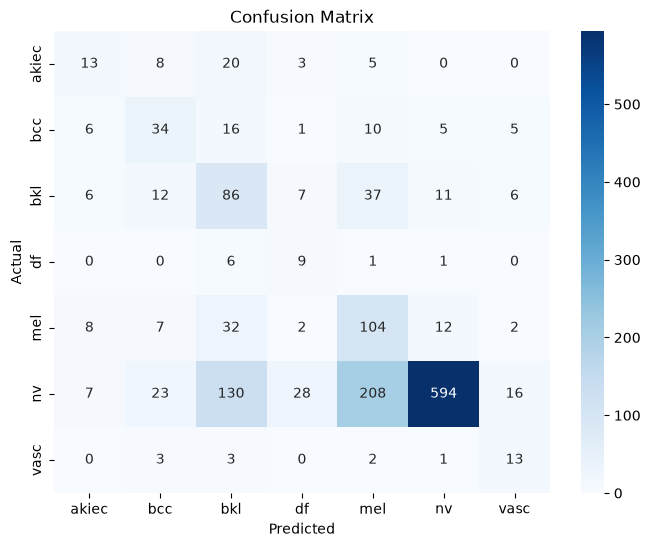

In [11]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

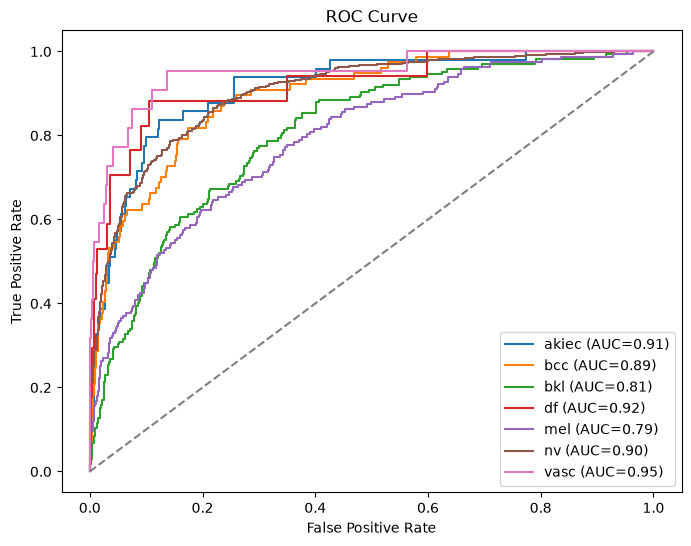

In [12]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

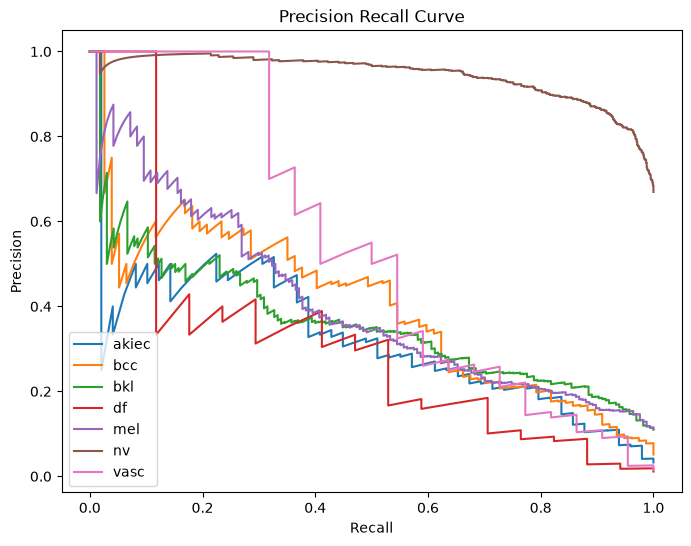

In [13]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

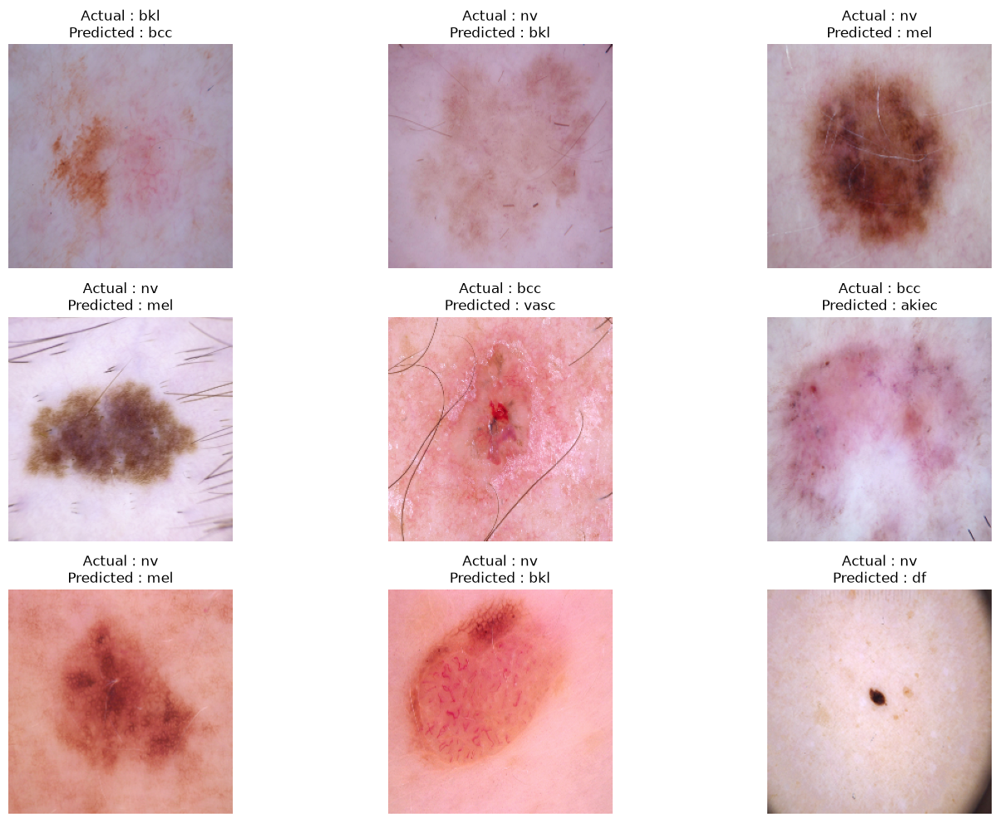

In [14]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# DenseNet 

In [15]:
y_probability = densenet_model.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 186s 4s/step
Accuracy : 0.573519627411843
Precision : 0.7463114380249821
Recall : 0.573519627411843
F1 Score : 0.6258455184572128


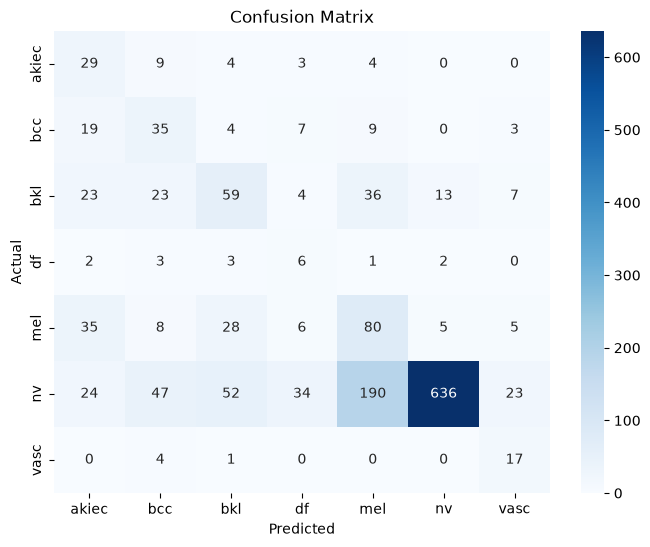

In [17]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

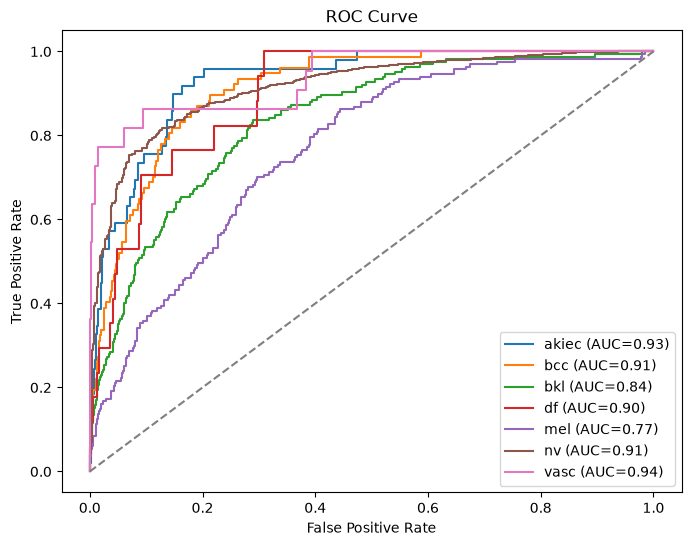

In [18]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

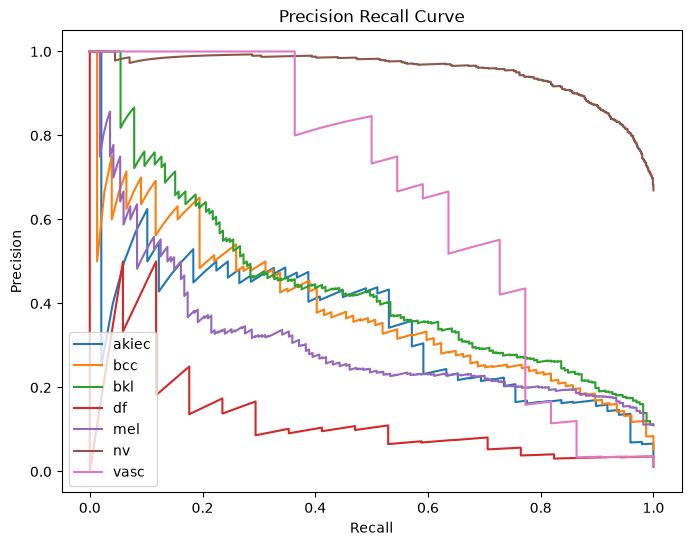

In [19]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

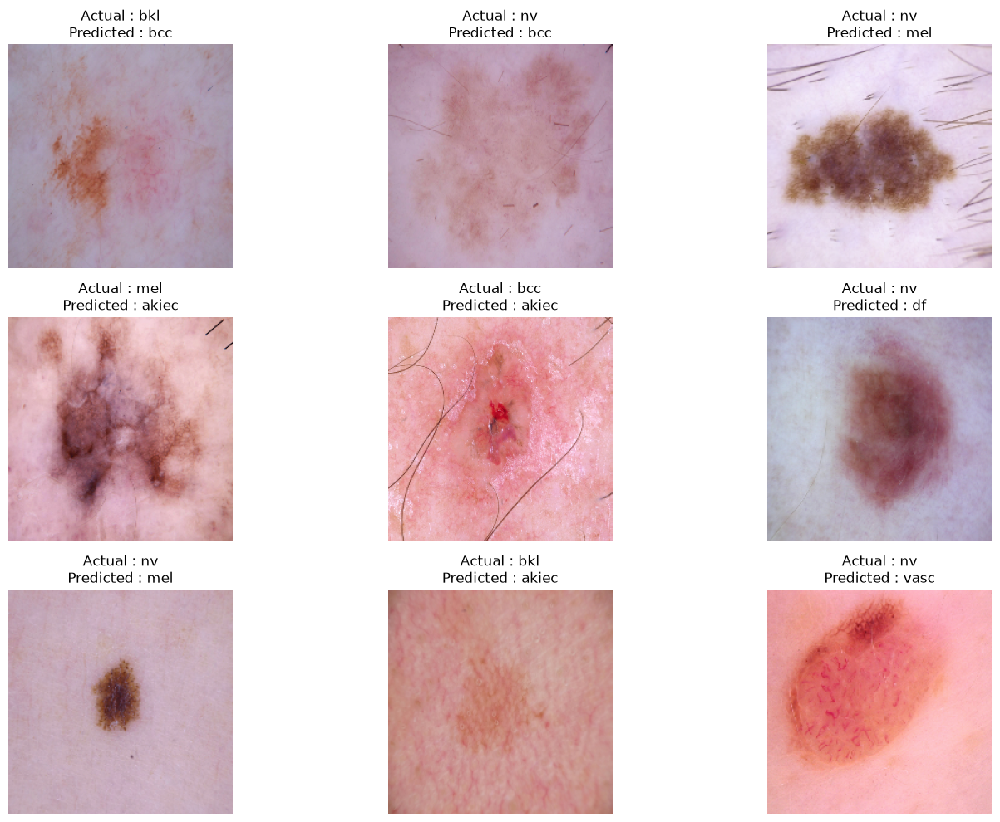

In [20]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# ResNet

In [22]:
y_probability = resnet_model.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step
Accuracy : 0.011310711909514305
Precision : 0.00012801737846986896
Recall : 0.011310711909514305
F1 Score : 0.0002531693251635855


/home/aximsoft/snap/code/253/.local/share/virtualenvs/Skin_Disease_Classification___Diagnosis_Pl-WW3Rx1qq/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


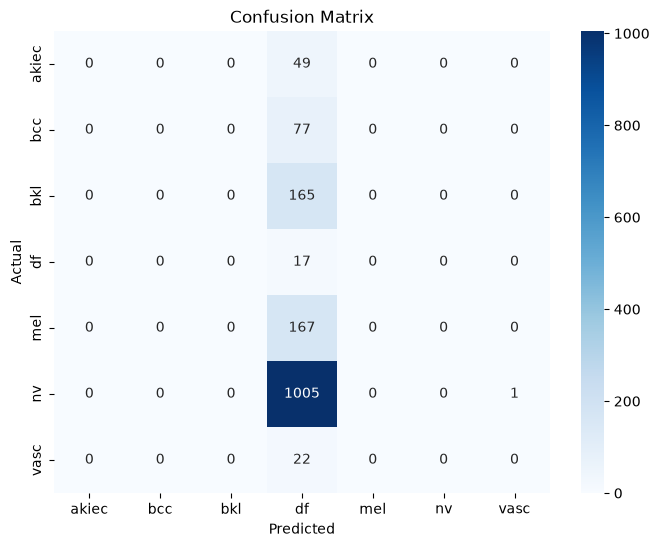

In [23]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

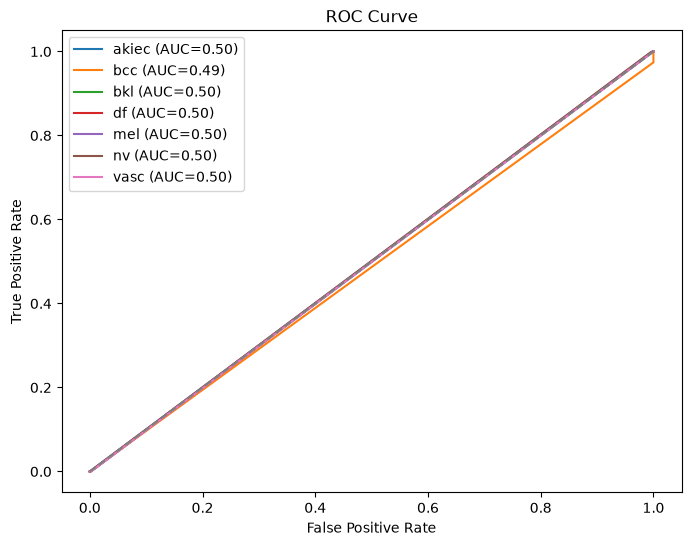

In [24]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

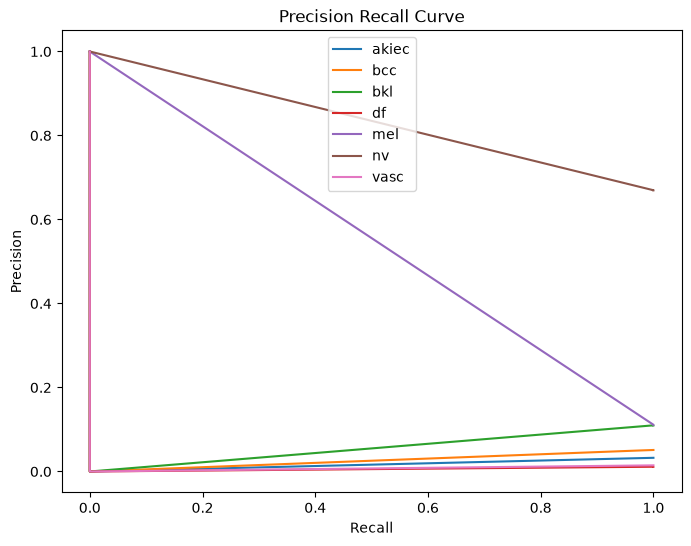

In [25]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

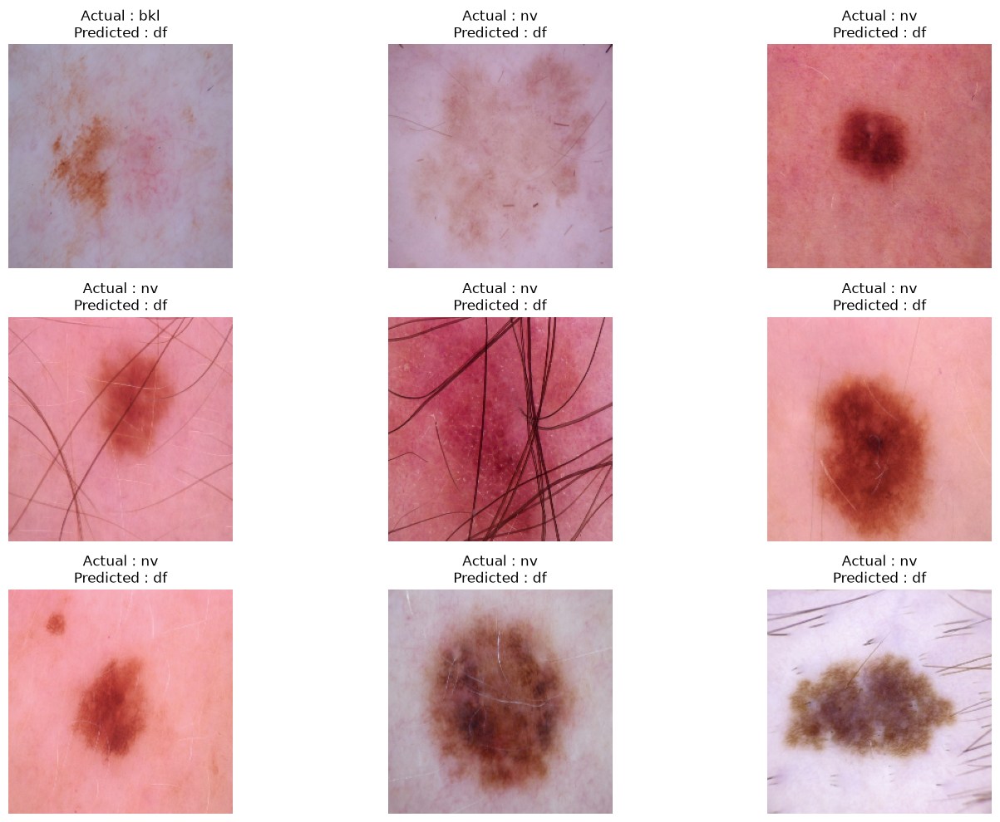

In [26]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

# Efficient Net

In [27]:
y_probability = efficient_model.predict(test_dataset)

y_prediction = np.argmax(
    y_probability,
    axis=1
)

y_true = np.concatenate([

    labels.numpy()

    for images, labels in test_dataset

])

accuracy = accuracy_score(
    y_true,
    y_prediction
)

print("Accuracy :", accuracy)

precision = precision_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Precision :", precision)

recall = recall_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("Recall :", recall)


f1 = f1_score(

    y_true,

    y_prediction,

    average="weighted"

)

print("F1 Score :", f1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 528s 11s/step
Accuracy : 0.014637391882900865
Precision : 0.00021425324113361215
Recall : 0.014637391882900865
F1 Score : 0.0004223247494082873


/home/aximsoft/snap/code/253/.local/share/virtualenvs/Skin_Disease_Classification___Diagnosis_Pl-WW3Rx1qq/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


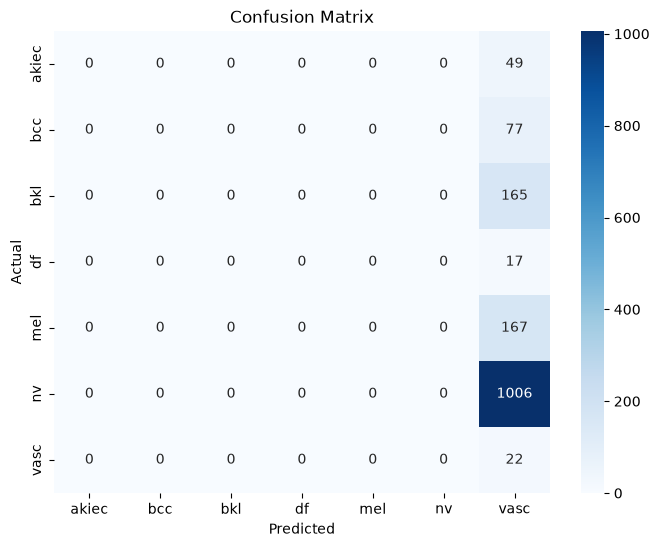

In [28]:
cm = confusion_matrix(

    y_true,

    y_prediction

)

plt.figure(figsize=(8,6))

sns.heatmap(

    cm,

    annot=True,

    fmt="d",

    cmap="Blues",

    xticklabels=label_encoder.classes_,

    yticklabels=label_encoder.classes_

)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

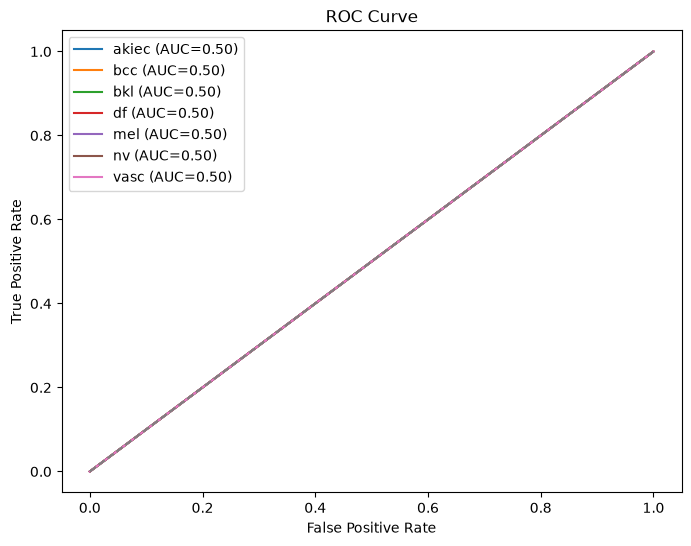

In [29]:
y_true_binary = label_binarize(

    y_true,

    classes=np.arange(NUM_CLASSES)

)

plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    fpr, tpr, _ = roc_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    roc_auc = auc(

        fpr,

        tpr

    )

    plt.plot(

        fpr,

        tpr,

        label=f"{label_encoder.classes_[i]} (AUC={roc_auc:.2f})"

    )

plt.plot(

    [0,1],

    [0,1],

    "--"

)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.show()

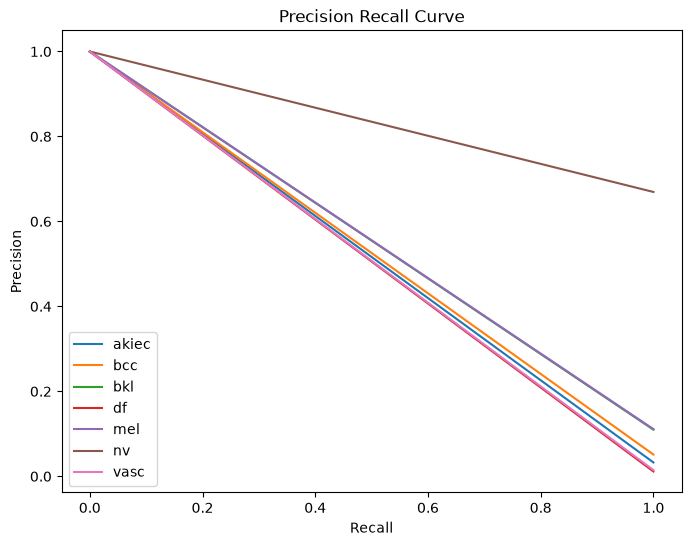

In [30]:
plt.figure(figsize=(8,6))

for i in range(NUM_CLASSES):

    precision, recall, _ = precision_recall_curve(

        y_true_binary[:,i],

        y_probability[:,i]

    )

    plt.plot(

        recall,

        precision,

        label=label_encoder.classes_[i]

    )

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision Recall Curve")

plt.legend()

plt.show()

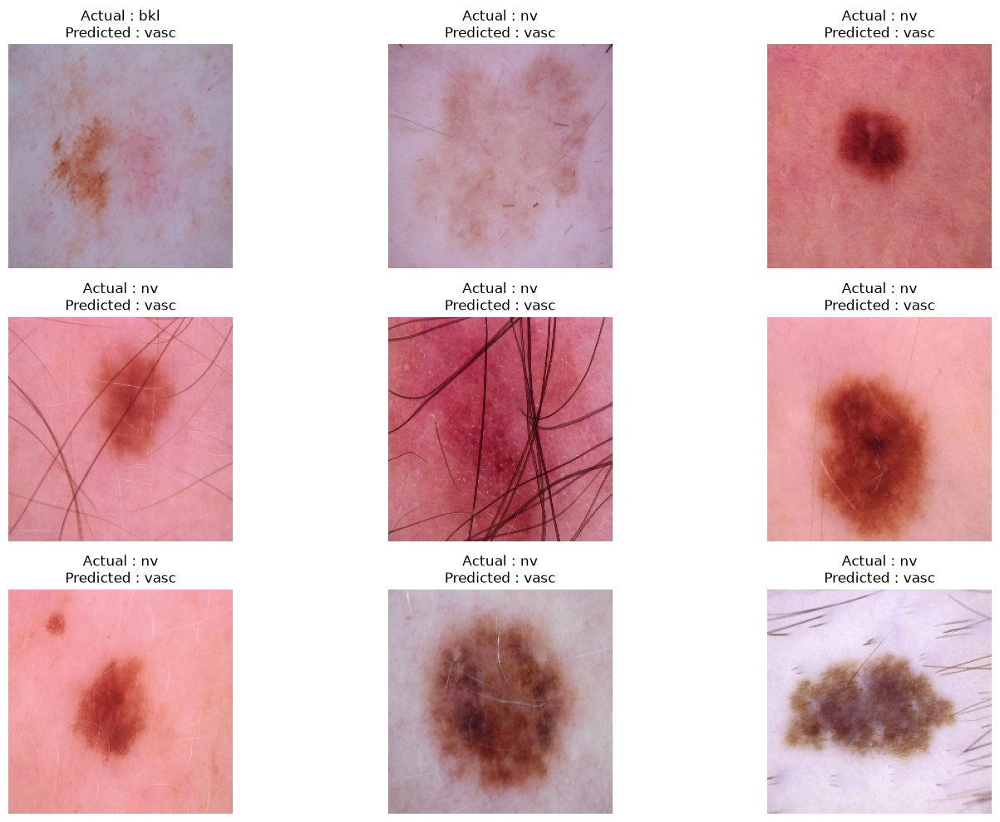

In [31]:
wrong = np.where(

    y_true != y_prediction

)[0]

plt.figure(figsize=(15,10))

for i, index in enumerate(wrong[:9]):

    image = list(test_dataset.unbatch())[index][0]

    plt.subplot(3,3,i+1)

    plt.imshow(image)

    plt.title(

        f"Actual : {label_encoder.classes_[y_true[index]]}\n"

        f"Predicted : {label_encoder.classes_[y_prediction[index]]}"

    )

    plt.axis("off")

plt.tight_layout()

plt.show()

In [33]:
comparison = pd.DataFrame({

    "Model":[

        "Basic CNN",

        "Deep CNN",

        "CNN + BatchNorm",

        "CNN + Dropout",

        "MobileNetV2",

        "EfficientNetB0",

        "ResNet50",

        "DenseNet121"

    ],

    "Accuracy":[0.5808383233532934, 0.5342648037258816, 0.562874251497006, 0.45109780439121755,  0.5675316034597472, 0.573519627411843, 0.5675316034597472, 0.5129077642584795],

    "Precision":[0.7450449006284618, 0.7017389761573686,  0.6768042289390137, 0.6916289220458761, 0.7380408370113237, 0.7463114380249821, 0.6916289220458761, 0.7380408370113237],

    "Recall":[ 0.5808383233532934, 0.5342648037258816, 0.562874251497006, 0.45109780439121755, 0.5675316034597472, 0.573519627411843, 0.5808383233532934, 0.530408370113237],

    "F1 Score":[0.6289536403830991, 0.5865444453513914, 0.6013955638421254, 0.5129077642584795, 0.6120873032554363, 0.6258455184572128, 0.5675316034597472, 0.5129077642584795],

})

comparison

,Model,Accuracy,Precision,Recall,F1 Score
0,Basic CNN,0.580838,0.745045,0.580838,0.628954
1,Deep CNN,0.534265,0.701739,0.534265,0.586544
2,CNN + BatchNorm,0.562874,0.676804,0.562874,0.601396
3,CNN + Dropout,0.451098,0.691629,0.451098,0.512908
4,MobileNetV2,0.567532,0.738041,0.567532,0.612087
5,EfficientNetB0,0.573520,0.746311,0.573520,0.625846
6,ResNet50,0.567532,0.691629,0.580838,0.567532
7,DenseNet121,0.512908,0.738041,0.530408,0.512908
